In [1]:
import numpy as np
import pandas as pd

In [2]:
# Deep learning libraries
import tensorflow as tf
import keras
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import applications
from keras.models import Sequential, load_model
from keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Flatten, Dense, Dropout
from keras.preprocessing import image
from tensorflow.keras.utils import image_dataset_from_directory
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

# Some constants
FINE_TUNING_EPOCHS = 5
TRAINING_EPOCHS = 3
BATCH_SIZE = 32
image_height = 299
image_width = 299

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZTVN10tenso

In [3]:
# Data agumentation and pre-processing using Tensorflow
train_gen = ImageDataGenerator(rescale = 1./255,
                         zoom_range = 0.05,
                         width_shift_range = 0.05,
                         height_shift_range = 0.05,
                         brightness_range = [0.95,1.05])

train_generator = train_gen.flow_from_directory(
    directory = "/kaggle/input/chest-xray-pneumonia/chest_xray/train",
    color_mode = "rgb",
    target_size = (image_height, image_width),
    class_mode = "categorical",
    batch_size = BATCH_SIZE,
    shuffle = True,
    seed = 42)

val_test_gen = ImageDataGenerator(rescale = 1./255.)

validation_generator = val_test_gen.flow_from_directory(
    directory   = "/kaggle/input/chest-xray-pneumonia/chest_xray/val",
    color_mode  = "rgb",
    target_size = (image_height, image_width),
    class_mode  = "categorical",
    batch_size  = BATCH_SIZE,
    shuffle     = False,
    seed        = 42)

test_generator = val_test_gen.flow_from_directory(
    directory   = "/kaggle/input/chest-xray-pneumonia/chest_xray/test",
    color_mode  = "rgb",
    target_size = (image_height, image_width),
    class_mode  = "categorical",
    batch_size  = BATCH_SIZE,
    shuffle     = False,
    seed        = 42)

Found 5216 images belonging to 2 classes.
Found 16 images belonging to 2 classes.
Found 624 images belonging to 2 classes.


In [4]:
# Get labels in dataset
a = train_generator.class_indices
class_names = list(a.keys())

print(class_names)

['NORMAL', 'PNEUMONIA']


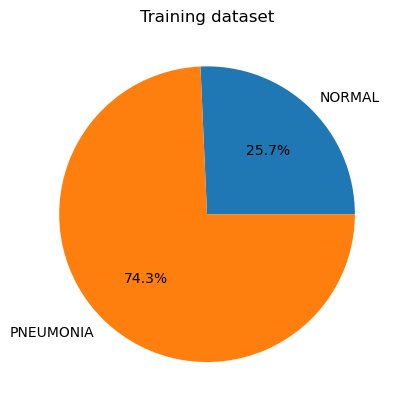

In [5]:
# Get frequency of each class to check if the data is unbalanced
freq = np.unique(train_generator.classes, return_counts=True)

plt.title("Training dataset")
plt.pie(freq[1], labels = class_names, autopct='%1.1f%%');

In [6]:
# Computing class weights to handle imbalanced data
from sklearn.utils.class_weight import compute_class_weight

class_weights = compute_class_weight(class_weight = "balanced", classes= np.unique(train_generator.classes), y= train_generator.classes)
class_weights = dict(zip(np.unique(train_generator.classes), class_weights))
print(class_weights)

{0: 1.9448173005219984, 1: 0.6730322580645162}


In [7]:
# Plots a grid of images with their true labels
# Optionally, it can also show predicted labels and their confidence scores
def plot_images(img, true_labels, predictions = None):
    plt.figure(figsize=[12, 18])
    for i in range(24):
        plt.subplot(6, 4, i+1)
        plt.imshow(img[i])
        plt.axis('off')
        if (predictions is not None):
            plt.title("{}\n {} {:.1f}%".format(class_names[np.argmax(true_labels[i])], class_names[np.argmax(predictions[i])], 100 * np.max(predictions[i])))
        else:
            plt.title(class_names[np.argmax(true_labels[i])])    

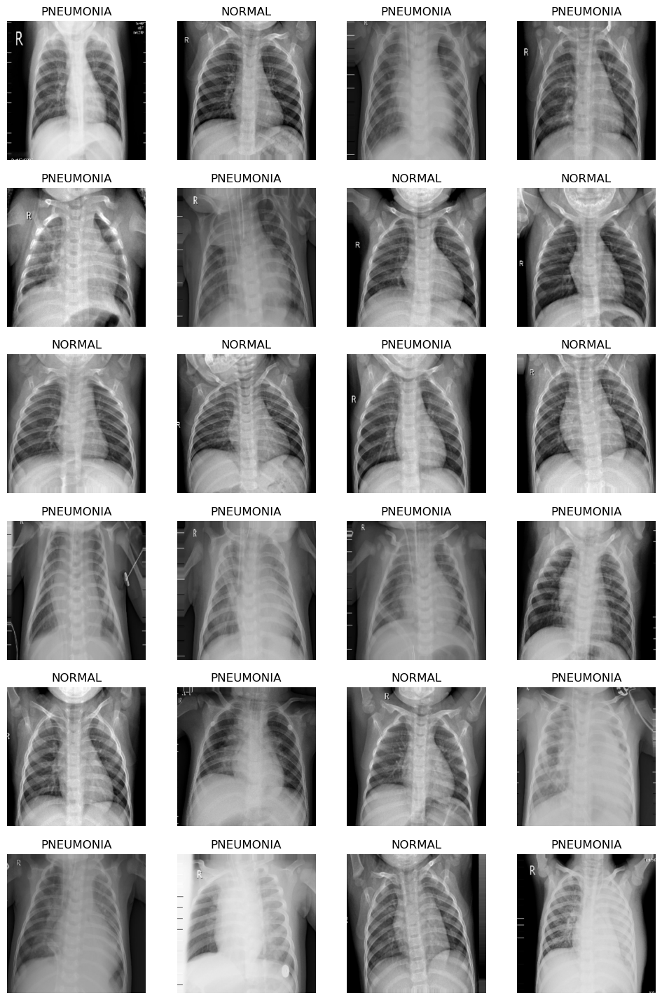

In [8]:
x,y = next(train_generator)
plot_images(x,y)

In [9]:
# Plots training and validation accuracy and loss over epochs
def plot_history(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    # Accuracy
    plt.figure(figsize=(5, 8))
    plt.rcParams['figure.figsize'] = [8, 4]
    plt.rcParams['font.size'] = 10
    plt.rcParams['axes.grid'] = True
    plt.rcParams['figure.facecolor'] = 'white'
    plt.subplot(2, 1, 1)
    plt.plot(acc, label='Training Accuracy')
    plt.plot(val_acc, label='Validation Accuracy')
    plt.legend(loc='lower right')
    plt.ylabel('Accuracy')
    plt.title(f'\nTraining and Validation Accuracy. \nTrain Accuracy: {str(round(acc[-1],3))}\nValidation Accuracy: {str(round(val_acc[-1],3))}')
    
    # Loss
    plt.subplot(2, 1, 2)
    plt.plot(loss, label='Training Loss')
    plt.plot(val_loss, label='Validation Loss')
    plt.legend(loc='upper right')
    plt.ylabel('Cross Entropy')
    plt.title(f'Training and Validation Loss. \nTrain Loss: {str(round(loss[-1],3))}\nValidation Loss: {str(round(val_loss[-1],3))}')
    plt.xlabel('epoch')
    plt.tight_layout(pad=3.0)
    plt.show()

In [10]:
# Creates a heatmap to visualize the confusion matrix along with sensitivity and specificity values
import seaborn as sns
from sklearn.metrics import confusion_matrix

def plot_heatmap(y_true, y_pred, class_names, ax, title):
    cm = confusion_matrix(y_true, y_pred)
    
    sensitivity = cm[1,1]/(cm[1,0]+cm[1,1])
    specificity = cm[0,0]/(cm[0,0]+cm[0,1])
    
    new_title = f'{title}\n Sensitivity = {sensitivity:.2f} Specificity = {specificity:.2f}'
    
    sns.heatmap(
        cm,
        annot=True,
        square=True,
        xticklabels=class_names,
        yticklabels=class_names,
        fmt='d',
        cmap=plt.cm.Blues,
        cbar=False,
        ax=ax)
    
    ax.set_title(new_title, fontsize = 12)
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 45, ha = "right")
    ax.set_ylabel('True Label', fontsize= 10)
    ax.set_xlabel('Predicted Label', fontsize = 10)

In [11]:
from matplotlib import cm

# Helps visualize which parts of the input image are important for the model's prediction by generating a heatmap overlay
def make_gradcam_heatmap(image, model, last_conv_layer_name):
    img_array = tf.expand_dims(image, axis=0)
    
    # Remove last layer's softmax
    last_layer_activation = model.layers[-1].activation
    model.layers[-1].activation = None
    
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )
    
    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]
    
    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)
    
    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    
    # We multiply each channel in the feature map array
    # by "how important this channel is" with regards to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    
    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    heatmap = heatmap.numpy()  
    
    # We rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)
    
    # We use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")
    
    # We use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]
    
    # We create an image with RGB colorized heatmap
    jet_heatmap = tf.keras.utils.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img_array[0].shape[1], img_array[0].shape[0]))
    jet_heatmap = tf.keras.utils.img_to_array(jet_heatmap)
    
    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * 0.4 + img_array[0] * 255
    superimposed_img = tf.keras.utils.array_to_img(superimposed_img)
    
    # Restore last layer activation
    model.layers[-1].activation = last_layer_activation
    
    return superimposed_img

In [12]:
from tensorflow.keras.models import Model

# Builds a classification model on top of a pre-trained base model
def create_model(base_model):
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(128, activation = 'relu')(x)
    x = Dropout(0.4)(x)
    x = Dense(64, activation = 'relu')(x)
    x = Dropout(0.2)(x)
    
    outputs = Dense(len(class_names), activation='softmax')(x)
    
    model = Model(base_model.inputs, outputs)
    
    return model

In [13]:
# Training the model
# Returns the training history, which contains information about the training and validation accuracy and loss for each epoch
def fit_model(model, base_model, epochs, fine_tune = 0):
    early = tf.keras.callbacks.EarlyStopping( patience = 10,
                                              min_delta = 0.001,
                                              restore_best_weights = True)
    
    print("Unfreezing number of layers in base model = ", fine_tune)
    
    if fine_tune > 0:
        base_model.trainable = True
        for layer in base_model.layers[:-fine_tune]:
            layer.trainable = False       
        model.compile(optimizer=tf.keras.optimizers.Adam(1e-5),
                      loss='categorical_crossentropy',
                      metrics=['accuracy'])
    else:
        base_model.trainable = False
        model.compile(optimizer=tf.keras.optimizers.Adam(),
                      loss='categorical_crossentropy',
                      metrics=['accuracy'])
    
    history = model.fit(train_generator,
                        validation_data = validation_generator,
                        epochs = epochs,
                        callbacks = [early],
                        class_weight=class_weights)
    
    return history

### Using the Inception Model

In [14]:
# Load the InceptionResNetV2 architecture with "imagenet" weights as base
inception_base_model = tf.keras.applications.InceptionResNetV2(
                     include_top = False,
                     weights = 'imagenet',
                     input_shape = (image_height, image_width, 3)
                     )
 
inception_model = create_model(inception_base_model)
history = fit_model(inception_model, inception_base_model, epochs = TRAINING_EPOCHS)

219055592/219055592 [==============================] - 1s 0us/step
Unfreezing number of layers in base model =  0
Epoch 1/3
163/163 [==============================] - 194s 1s/step - loss: 0.3035 - accuracy: 0.8610 - val_loss: 0.2141 - val_accuracy: 0.9375
Epoch 2/3
163/163 [==============================] - 151s 928ms/step - loss: 0.2193 - accuracy: 0.9103 - val_loss: 0.1327 - val_accuracy: 0.9375
Epoch 3/3
163/163 [==============================] - 150s 919ms/step - loss: 0.2020 - accuracy: 0.9208 - val_loss: 0.1444 - val_accuracy: 0.9375


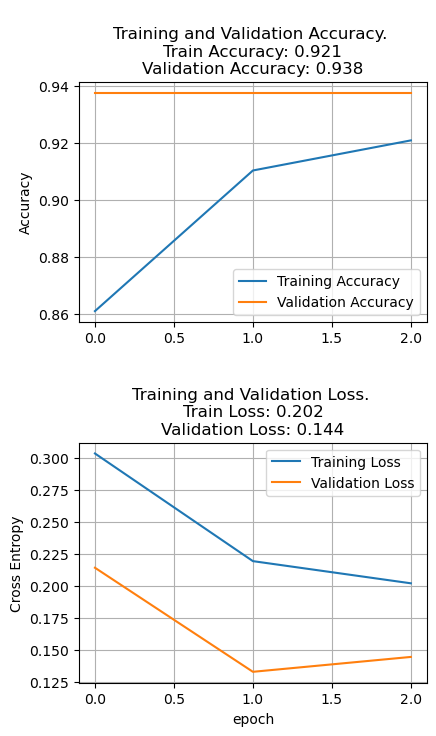

In [15]:
plot_history(history)

In [16]:
# Fine-tuning the InceptionResNetV2 base model by allowing a fraction of its layers
# to be trained along with the custom classification layers
nr_base_layers = len(inception_base_model.layers)
print("Inception base layers = ", nr_base_layers)    

history = fit_model(inception_model, inception_base_model, epochs = FINE_TUNING_EPOCHS, fine_tune = int(nr_base_layers/4))

Inception base layers =  780
Unfreezing number of layers in base model =  195
Epoch 1/5
163/163 [==============================] - 184s 922ms/step - loss: 0.2151 - accuracy: 0.9189 - val_loss: 0.3451 - val_accuracy: 0.8750
Epoch 2/5
163/163 [==============================] - 150s 922ms/step - loss: 0.1386 - accuracy: 0.9511 - val_loss: 0.3606 - val_accuracy: 0.8750
Epoch 3/5
163/163 [==============================] - 151s 924ms/step - loss: 0.1034 - accuracy: 0.9641 - val_loss: 0.2608 - val_accuracy: 0.8750
Epoch 4/5
163/163 [==============================] - 151s 925ms/step - loss: 0.0779 - accuracy: 0.9735 - val_loss: 0.3382 - val_accuracy: 0.8750
Epoch 5/5
163/163 [==============================] - 150s 922ms/step - loss: 0.0667 - accuracy: 0.9778 - val_loss: 0.1915 - val_accuracy: 0.8750


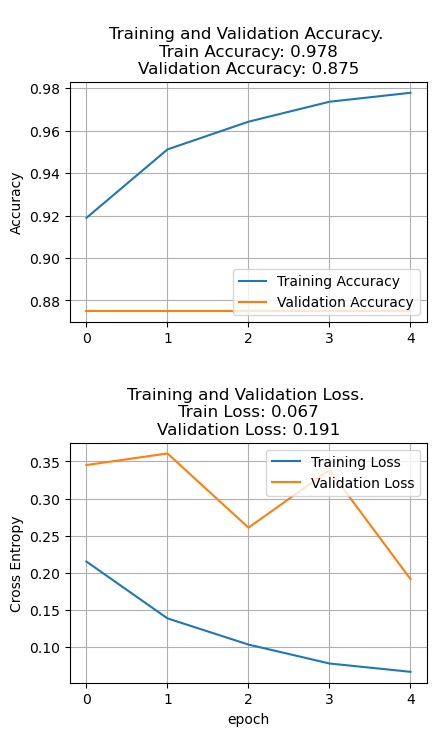

In [17]:
 plot_history(history)

In [18]:
# Inception model evaluation
accuracy_score = inception_model.evaluate(test_generator)

print(accuracy_score)
print("Accuracy: {:.2f}%".format(accuracy_score[1] * 100))
print("Loss: {:.3f}".format(accuracy_score[0]))

20/20 [==============================] - 10s 488ms/step - loss: 0.3268 - accuracy: 0.8910
[0.3267885148525238, 0.8910256624221802]
Accuracy: 89.10%
Loss: 0.327


In [19]:
# Perform predictions to allow computation of the confusion matrix later on
# Do not shuffle predictions otherwise we have no way of finding out the true labels
test_generator.reset()
inception_test_preds = inception_model.predict(test_generator)
inception_test_pred_classes = np.argmax(inception_test_preds, axis=1)

20/20 [==============================] - 10s 303ms/step


In [20]:
# Calculating the ROC curve and AUC for the predictions made by the InceptionResNetV2 model
fpr_inception, tpr_inception, thresholds_inception = roc_curve(test_generator.classes, inception_test_preds[:,1])
auc_inception = auc(fpr_inception, tpr_inception)

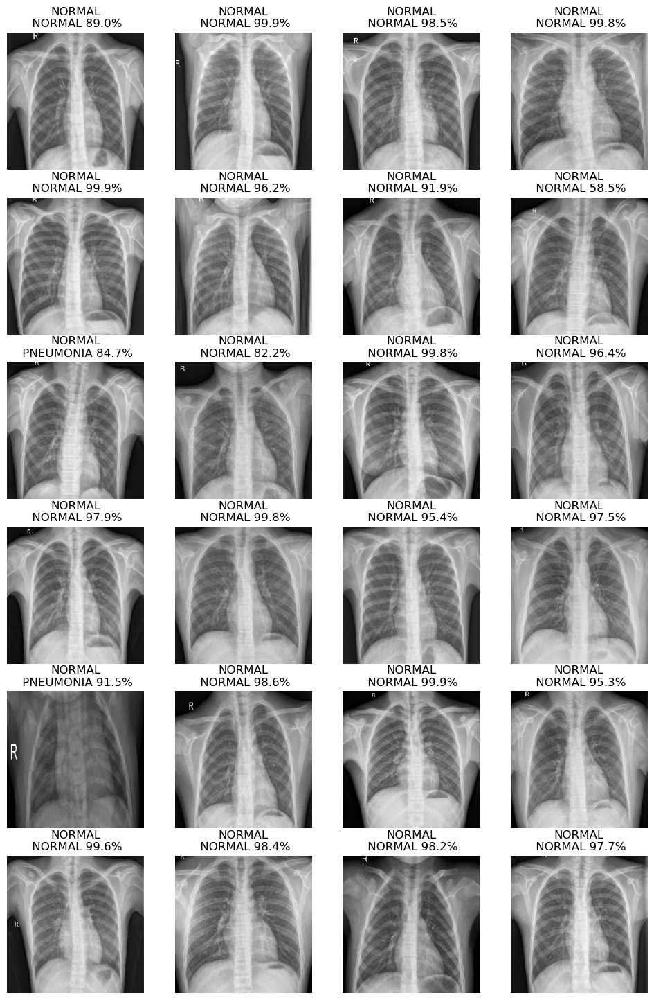

In [21]:
test_generator.reset()
x, y = next(test_generator)
plot_images(x, y, inception_test_preds)

/tmp/ipykernel_27/3721673303.py:47: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


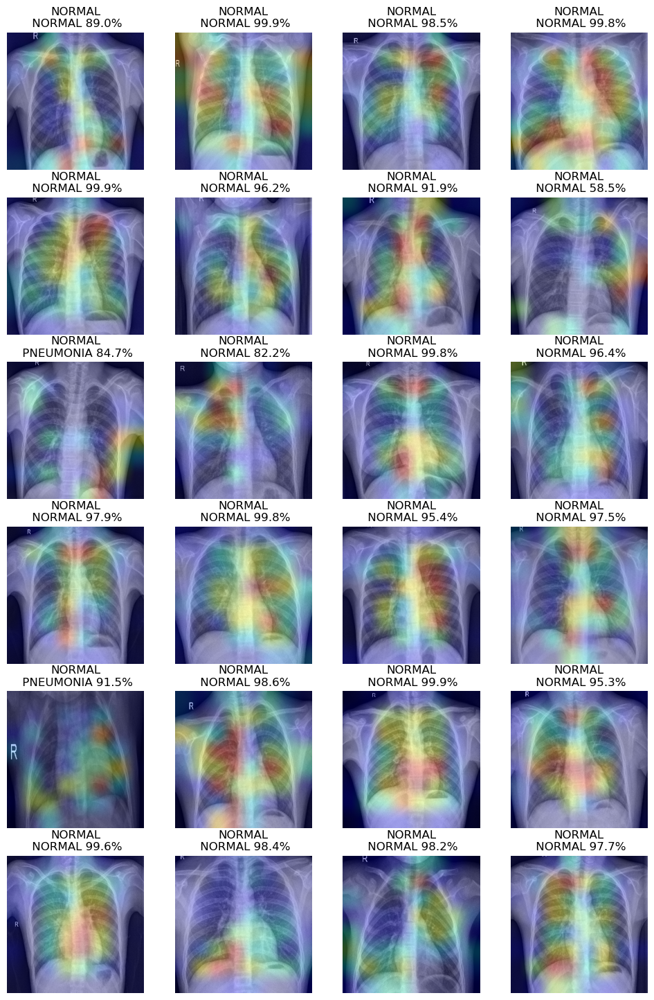

In [22]:
# Help understand which parts of the images contribute most to the model's predictions
last_conv_layer_name = "conv_7b_ac"

heatmaps =[]

for img in x:
    heatmap = make_gradcam_heatmap(img, inception_model, last_conv_layer_name)
    heatmaps.append(heatmap)
    
plot_images(heatmaps, y, inception_test_preds)

### Using the VGG16 Model

In [23]:
# Load the VGG16 architecture with "imagenet" weights as base
vgg16_base_model = tf.keras.applications.vgg16.VGG16(
                             include_top = False,
                             weights = 'imagenet',
                             input_shape = (image_height, image_width, 3)
                             )

vgg16_model = create_model(vgg16_base_model)
history = fit_model(vgg16_model, vgg16_base_model, epochs = TRAINING_EPOCHS)

58889256/58889256 [==============================] - 0s 0us/step
Unfreezing number of layers in base model =  0
Epoch 1/3
163/163 [==============================] - 151s 895ms/step - loss: 0.4083 - accuracy: 0.7964 - val_loss: 0.3786 - val_accuracy: 0.6875
Epoch 2/3
163/163 [==============================] - 147s 898ms/step - loss: 0.2465 - accuracy: 0.8924 - val_loss: 0.3318 - val_accuracy: 0.8125
Epoch 3/3
163/163 [==============================] - 147s 901ms/step - loss: 0.2058 - accuracy: 0.9185 - val_loss: 0.4361 - val_accuracy: 0.8125


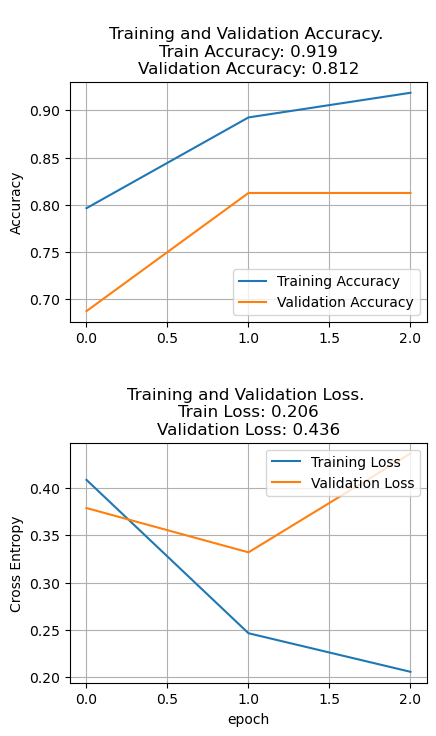

In [24]:
plot_history(history)

In [25]:
# Fine-tuning the VGG16 base model by allowing a fraction of its layers
# to be trained along with the custom classification layers
nr_base_layers = len(vgg16_base_model.layers)
print("VGG16 base layers = ", nr_base_layers)

history = fit_model(vgg16_model, vgg16_base_model, epochs = FINE_TUNING_EPOCHS, fine_tune = int(nr_base_layers/4))

VGG16 base layers =  19
Unfreezing number of layers in base model =  4
Epoch 1/5
163/163 [==============================] - 149s 895ms/step - loss: 0.1424 - accuracy: 0.9507 - val_loss: 0.1443 - val_accuracy: 0.9375
Epoch 2/5
163/163 [==============================] - 148s 905ms/step - loss: 0.0935 - accuracy: 0.9655 - val_loss: 0.1132 - val_accuracy: 0.9375
Epoch 3/5
163/163 [==============================] - 147s 900ms/step - loss: 0.0768 - accuracy: 0.9739 - val_loss: 0.1035 - val_accuracy: 0.9375
Epoch 4/5
163/163 [==============================] - 147s 898ms/step - loss: 0.0707 - accuracy: 0.9768 - val_loss: 0.0313 - val_accuracy: 1.0000
Epoch 5/5
163/163 [==============================] - 147s 900ms/step - loss: 0.0564 - accuracy: 0.9785 - val_loss: 0.0176 - val_accuracy: 1.0000


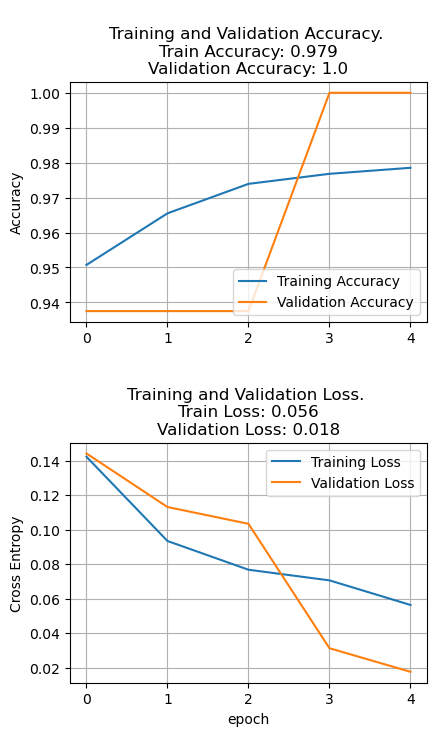

In [26]:
plot_history(history)

In [27]:
# VGG16 model evaluation
accuracy_score = vgg16_model.evaluate(test_generator)

print(accuracy_score)
print("Accuracy: {:.2f}%".format(accuracy_score[1] * 100))
print("Loss: {:.3f}".format(accuracy_score[0]))

20/20 [==============================] - 7s 312ms/step - loss: 0.2267 - accuracy: 0.9263
[0.22669489681720734, 0.9262820482254028]
Accuracy: 92.63%
Loss: 0.227


In [28]:
# Perform predictions to allow computation of the confusion matrix later on
# Do not shuffle predictions otherwise we have no way of finding out the true labels
test_generator.reset()

vgg16_test_preds = vgg16_model.predict(test_generator)
vgg16_test_pred_classes = np.argmax(vgg16_test_preds, axis=1)

20/20 [==============================] - 6s 290ms/step


In [29]:
# Calculating the ROC curve and AUC for the predictions made by the VGG16 model
fpr_vgg16, tpr_vgg16, thresholds_vgg16 = roc_curve(test_generator.classes, vgg16_test_preds[:,1])
auc_vgg16 = auc(fpr_vgg16, tpr_vgg16)

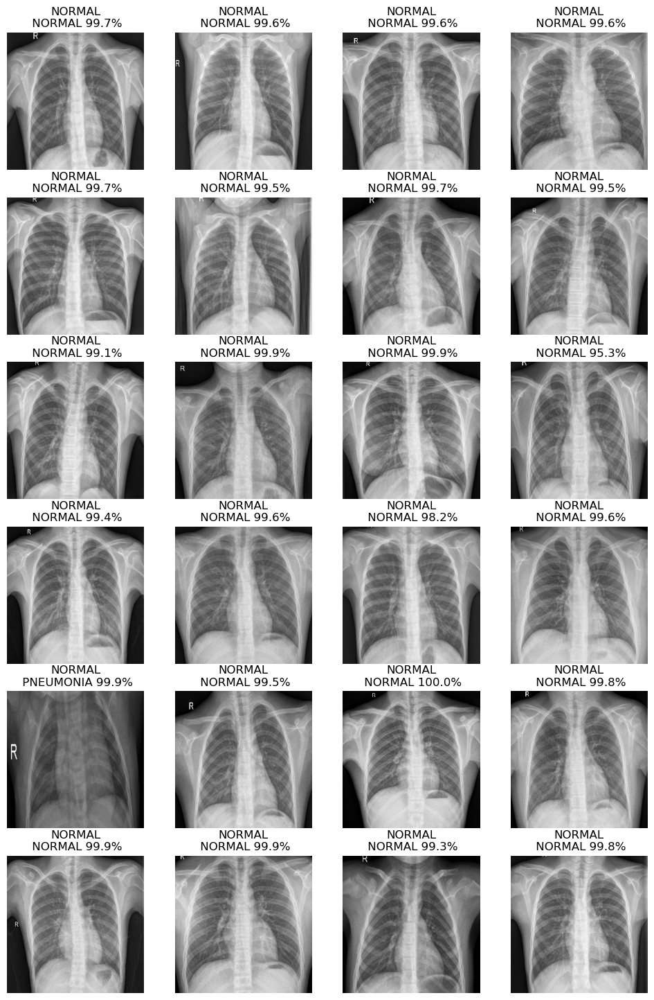

In [30]:
test_generator.reset()
x,y = next(test_generator)
plot_images(x, y, vgg16_test_preds)

/tmp/ipykernel_27/3721673303.py:47: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


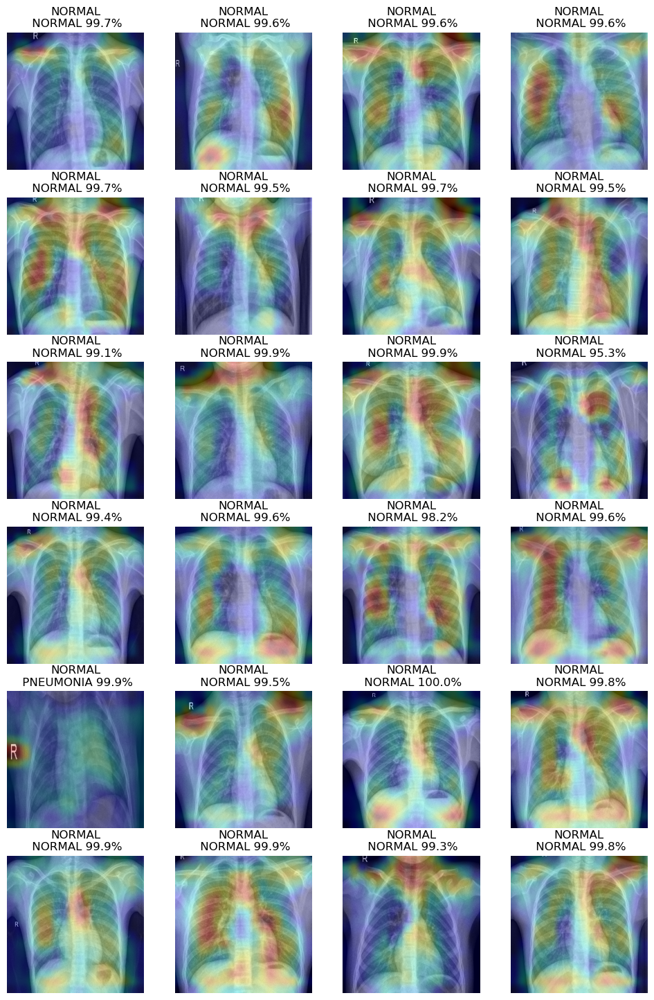

In [31]:
# Help understand which parts of the images contribute most to the model's predictions
last_conv_layer_name = "block5_conv3"

heatmaps =[]

for img in x:
    heatmap = make_gradcam_heatmap(img, vgg16_model, last_conv_layer_name)
    heatmaps.append(heatmap)

plot_images(heatmaps, y, vgg16_test_preds)

### Using the Xception Model

In [32]:
# Load the Xception architecture with "imagenet" weights as base
xception_base_model = tf.keras.applications.xception.Xception(
                                 include_top = False,
                                 weights = 'imagenet',
                                 input_shape = (image_height, image_width, 3)
                                 )

xception_model = create_model(xception_base_model)
history = fit_model(xception_model, xception_base_model, epochs = TRAINING_EPOCHS)

83683744/83683744 [==============================] - 1s 0us/step
Unfreezing number of layers in base model =  0
Epoch 1/3
163/163 [==============================] - 153s 907ms/step - loss: 0.2193 - accuracy: 0.9066 - val_loss: 0.2075 - val_accuracy: 0.8750
Epoch 2/3
163/163 [==============================] - 148s 907ms/step - loss: 0.1505 - accuracy: 0.9438 - val_loss: 0.2594 - val_accuracy: 0.8750
Epoch 3/3
163/163 [==============================] - 154s 941ms/step - loss: 0.1434 - accuracy: 0.9438 - val_loss: 0.1427 - val_accuracy: 1.0000


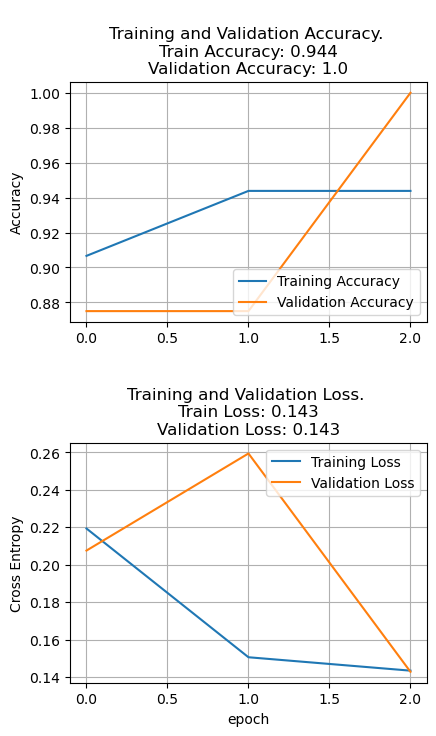

In [33]:
plot_history(history)

In [34]:
# Cleaning up - run if needed
import gc
gc.collect()

128985

In [35]:
# Fine-tuning the VGG16 base model by allowing a fraction of its layers
# to be trained along with the custom classification layers
nr_base_layers = len(xception_base_model.layers)
print("xception base layers = ", nr_base_layers)

history = fit_model(xception_model, xception_base_model, epochs = FINE_TUNING_EPOCHS, fine_tune = int(nr_base_layers/4))

xception base layers =  132
Unfreezing number of layers in base model =  33
Epoch 1/5
163/163 [==============================] - 165s 939ms/step - loss: 0.1864 - accuracy: 0.9335 - val_loss: 0.0914 - val_accuracy: 1.0000
Epoch 2/5
163/163 [==============================] - 156s 957ms/step - loss: 0.1167 - accuracy: 0.9526 - val_loss: 0.0753 - val_accuracy: 1.0000
Epoch 3/5
163/163 [==============================] - 160s 982ms/step - loss: 0.0937 - accuracy: 0.9615 - val_loss: 0.0563 - val_accuracy: 1.0000
Epoch 4/5
163/163 [==============================] - 156s 953ms/step - loss: 0.0791 - accuracy: 0.9676 - val_loss: 0.0375 - val_accuracy: 1.0000
Epoch 5/5
163/163 [==============================] - 156s 955ms/step - loss: 0.0732 - accuracy: 0.9720 - val_loss: 0.0179 - val_accuracy: 1.0000


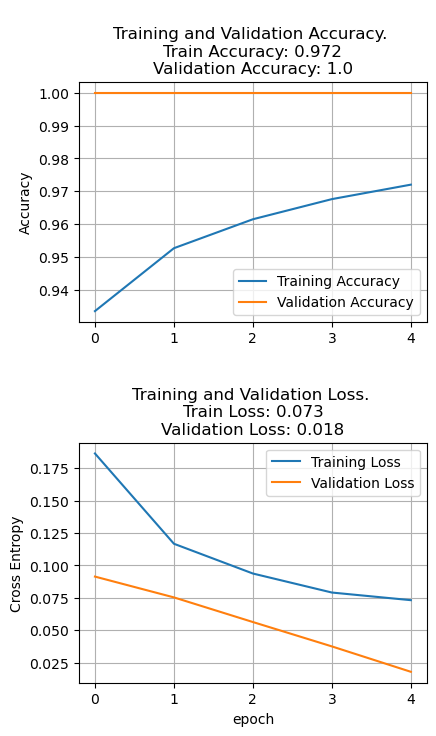

In [36]:
plot_history(history)

In [37]:
# Xception model evaluation
accuracy_score = xception_model.evaluate(test_generator)

print(accuracy_score)
print("Accuracy: {:.2f}%".format(accuracy_score[1] * 100))
print("Loss: {:.3f}".format(accuracy_score[0]))

20/20 [==============================] - 7s 344ms/step - loss: 0.3839 - accuracy: 0.8846
[0.38389620184898376, 0.8846153616905212]
Accuracy: 88.46%
Loss: 0.384


In [38]:
# Perform predictions to allow computation of the confusion matrix later on
# Do not shuffle predictions otherwise we have no way of finding out the true labels
test_generator.reset()

xception_test_preds = xception_model.predict(test_generator)
xception_test_pred_classes = np.argmax(xception_test_preds, axis = 1)

20/20 [==============================] - 7s 306ms/step


In [39]:
# Calculating the ROC curve and AUC for the predictions made by the Xception model
fpr_xception, tpr_xception, thresholds_xception = roc_curve(test_generator.classes, xception_test_preds[:,1])
auc_xception = auc(fpr_xception, tpr_xception)

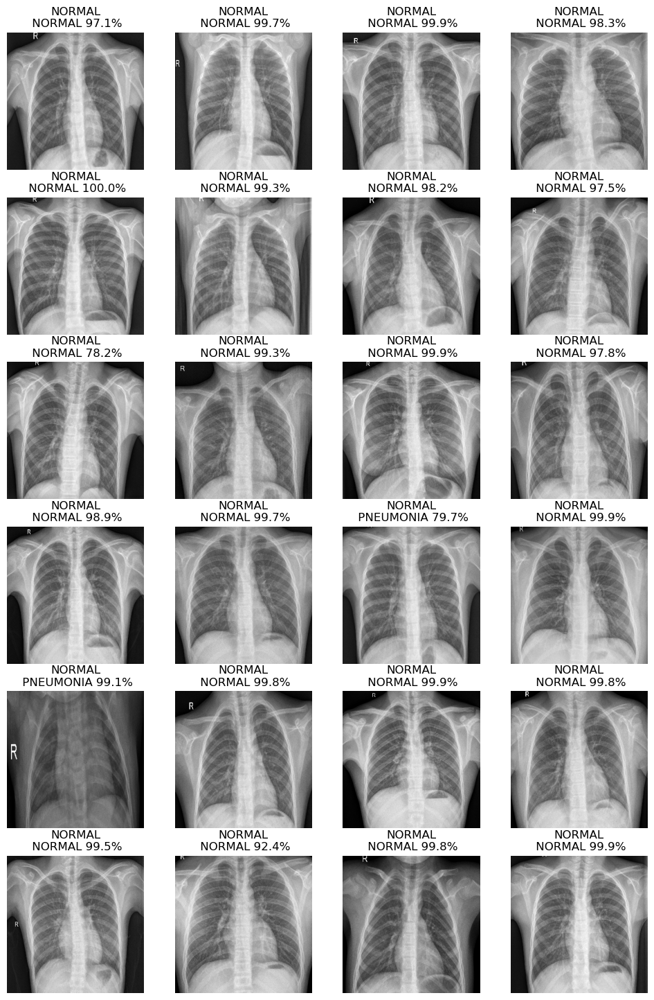

In [40]:
test_generator.reset()
x, y = next(test_generator)
plot_images(x, y, xception_test_preds)

/tmp/ipykernel_27/3721673303.py:47: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


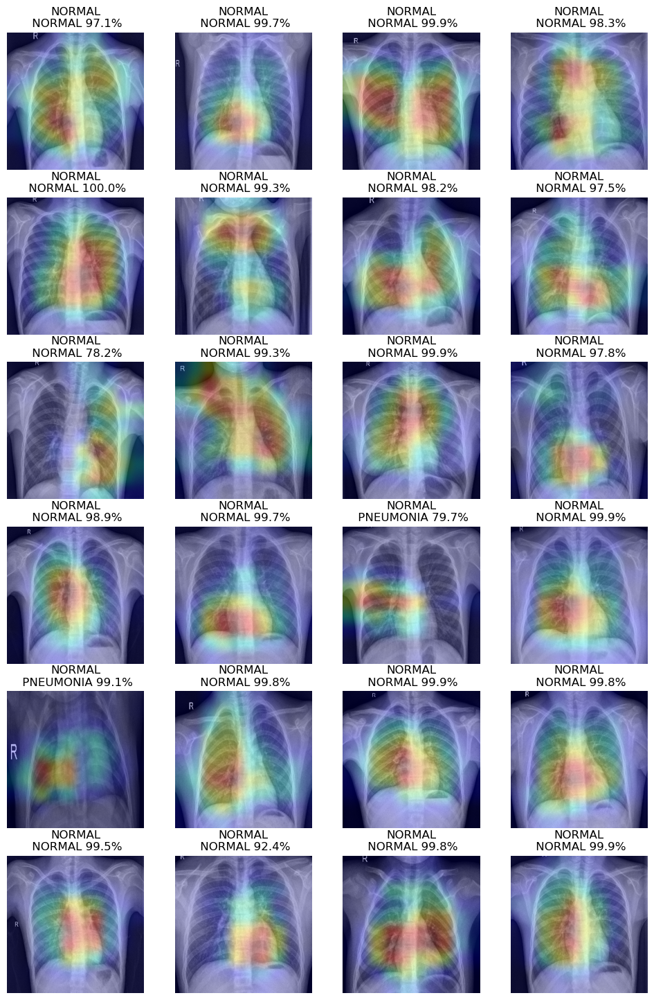

In [41]:
# Help understand which parts of the images contribute most to the model's predictions
last_conv_layer_name = "block14_sepconv2_act"

heatmaps = []

for img in x:
    heatmap = make_gradcam_heatmap(img, xception_model, last_conv_layer_name)
    heatmaps.append(heatmap)
    
plot_images(heatmaps, y, xception_test_preds)

### Comparison of Inception, VGG16, and Xception Models using Confusion Matrix

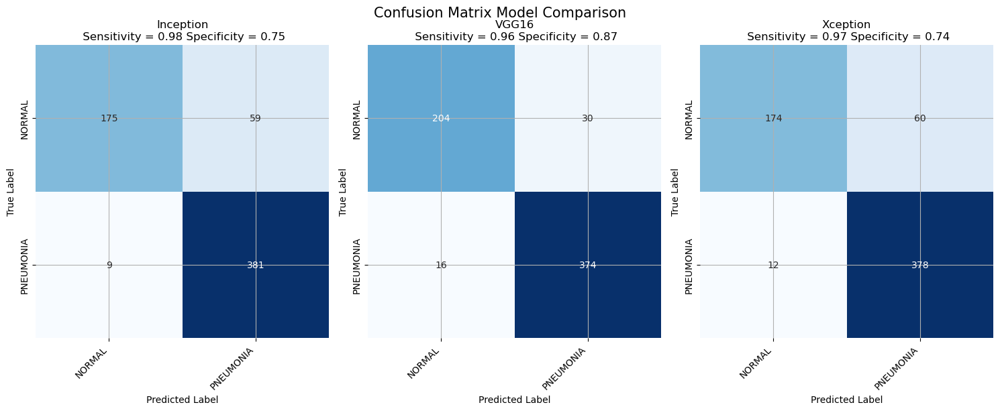

In [42]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 8))

true_classes = test_generator.classes

plot_heatmap(true_classes, inception_test_pred_classes, class_names, ax1, title = "Inception")
plot_heatmap(true_classes, vgg16_test_pred_classes, class_names, ax2, title = "VGG16")
plot_heatmap(true_classes, xception_test_pred_classes, class_names, ax3, title = "Xception")

fig.suptitle("Confusion Matrix Model Comparison", fontsize = 15)
fig.tight_layout()
fig.subplots_adjust(top=1.25)
plt.show()

### Ensemble Model - Averaging the Predictions of all Three Models (Inception, VGG16, Xception)

In [43]:
# Perform predictions to allow computation of the confusion matrix
ensemble_preds = np.add(np.add(inception_test_preds, vgg16_test_preds), xception_test_preds)/3.0
ensemble_test_pred_classes = np.argmax(ensemble_preds, axis = 1)

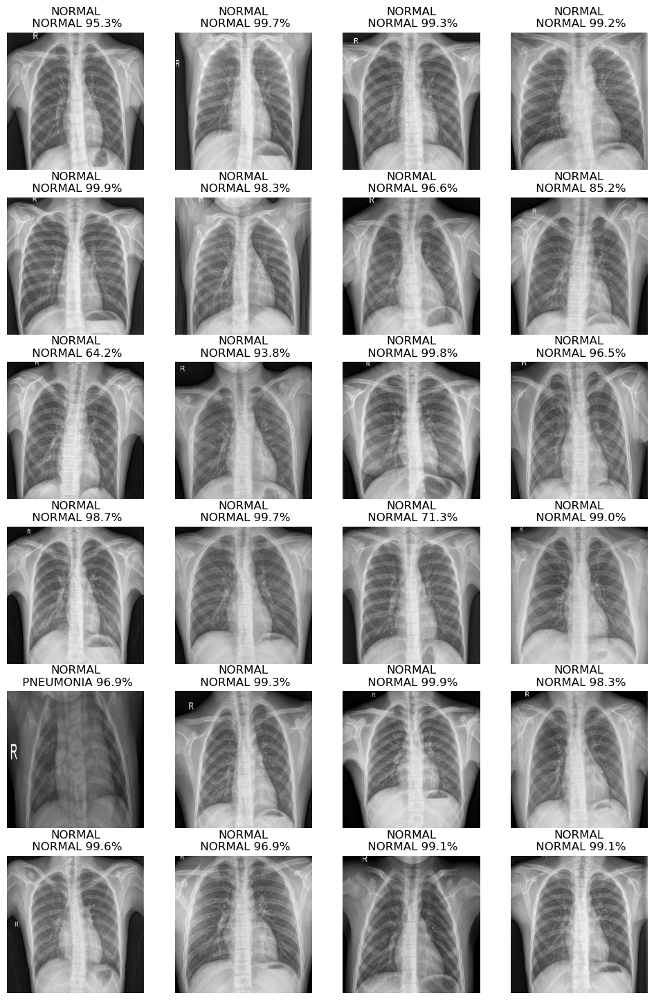

In [44]:
test_generator.reset()
x, y = next(test_generator)
plot_images(x, y, ensemble_preds)

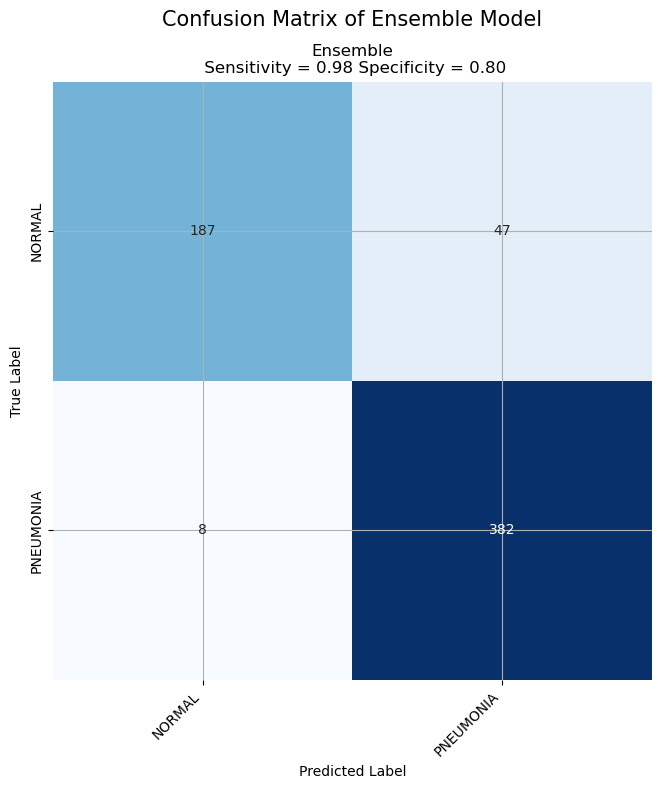

In [45]:
# Displaying confusion matrix for the ensemble model
fig, (ax1) = plt.subplots(1, 1, figsize=(15, 8))

true_classes = test_generator.classes

plot_heatmap(true_classes, ensemble_test_pred_classes, class_names, ax1, title = "Ensemble")        

fig.suptitle("Confusion Matrix of Ensemble Model", fontsize = 15)
fig.tight_layout()
plt.show()

In [46]:
# Calculating the ROC curve and AUC for the predictions made by the ensemble model
fpr_ensemble, tpr_ensemble, thresholds_ensemble = roc_curve(test_generator.classes, ensemble_preds[:,1])
auc_ensemble = auc(fpr_ensemble, tpr_ensemble)

### Final Evaluation

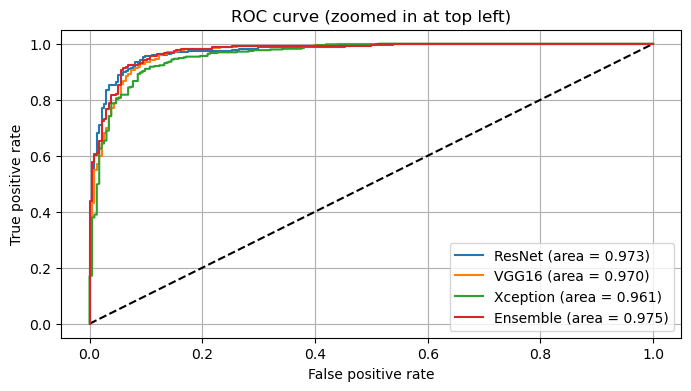

In [47]:
# Comparing the performance of different models in terms of their ability
# to correctly classify pneumonia cases while minimizing false positives
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr_inception, tpr_inception, label='ResNet (area = {:.3f})'.format(auc_inception))
plt.plot(fpr_vgg16, tpr_vgg16, label='VGG16 (area = {:.3f})'.format(auc_vgg16))
plt.plot(fpr_xception, tpr_xception, label='Xception (area = {:.3f})'.format(auc_xception))
plt.plot(fpr_ensemble, tpr_ensemble, label='Ensemble (area = {:.3f})'.format(auc_ensemble))
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve (zoomed in at top left)')
plt.legend(loc='best')
plt.show()